In [1]:
# general
import os, sys, time, glob, math
import numpy as np
from tqdm.auto import tqdm
from importlib import reload
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image

# torch
import torch
from torch.utils.data import Dataset, DataLoader

# custom
from utils.GetLowestGPU import GetLowestGPU
from utils.TileGenerator import TileGenerator
from utils.BuildUNet import BuildUNet

# device
if 'device' not in locals():
    device = torch.device(GetLowestGPU(verbose=2))
else:
    print(f'Device already set to {device}')

ModuleNotFoundError: No module named 'utils'

# Load images and masks

Found 102 images


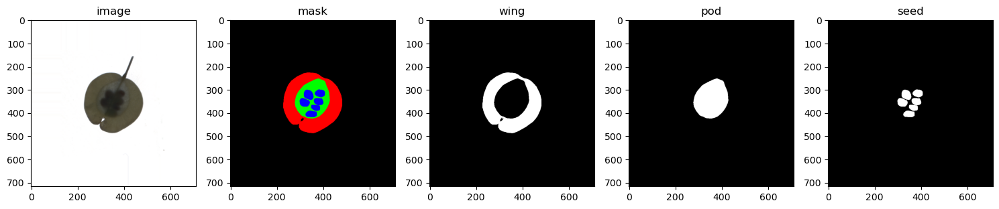

In [2]:
# options
image_path = 'data/images_by_pod/'
mask_path = 'data/masks_by_pod/'
pad = 128
figsize = 3

# get filenames
image_names = [os.path.basename(f) for f in glob.glob(mask_path + '*.png')]
image_names = sorted(image_names)
print(f'Found {len(image_names)} images')

# load images
images, masks = [], []
for name in image_names:

    # load image
    image = Image.open(image_path + name)
    image = np.array(image)[:, :, :3] / 255
    image = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), 'edge')
    images.append(image)

    # load mask
    mask = Image.open(mask_path + name)
    mask = np.array(mask) / 255
    mask = np.pad(mask, ((pad, pad), (pad, pad), (0, 0)), 'constant', constant_values=0)
    mask = mask > 0.5
    masks.append(mask)

# unpack wings, seed pods, and seeds
wings = [m[:, :, 0] for m in masks]
pods = [m[:, :, 1:].sum(-1) for m in masks]
seeds = [m[:, :, 2] for m in masks]

# function to overlay train/val split on image
def apply_overlay(ax, mask, rgb, alpha=0.35):
    overlay = np.ones((mask.shape[0], mask.shape[1], 4))
    overlay[:, :, 3] = 0
    overlay[mask] = rgb + [alpha]
    ax.set_autoscale_on(False)
    ax.imshow(overlay)

# plot example
i = np.random.randint(len(images))
nrows, ncols, _ = masks[i].shape
fig, axs = plt.subplots(1, 5, figsize=(5*figsize, nrows/ncols*figsize))
axs[0].imshow(images[i]); axs[0].set_title('image')
axs[1].imshow(1.0*masks[i]); axs[1].set_title('mask')
axs[2].imshow(wings[i], cmap='gray'); axs[2].set_title('wing')
axs[3].imshow(pods[i], cmap='gray'); axs[3].set_title('pod')
axs[4].imshow(seeds[i], cmap='gray'); axs[4].set_title('seed')
plt.tight_layout()
plt.show()

# Load model from checkpoint

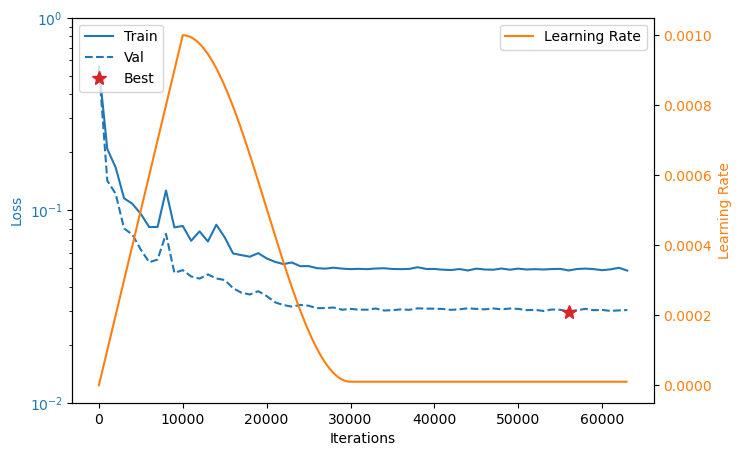

In [11]:
# options
warmup_iters = 10000 # number of iterations to reach max learning rate
lr_decay_iters = 30000 # number of iterations to reach min learning rate
max_lr = 1e-3
min_lr = 1e-5

# parse logs
logs = []
with open('data/logs/log.csv', 'r') as f:
    logs = f.readlines()
    logs = [l.strip() for l in logs][1:]
logs = [l.split(',') for l in logs]
logs = np.array(logs).astype(float)
iterations, train_loss, val_loss = logs.T
iterations = iterations.astype(int)

# get best model
best_iter = iterations[np.argmin(val_loss)]

def get_lr(it):
    if it < warmup_iters:
        return max_lr * it / warmup_iters
    if it > lr_decay_iters:
        return min_lr
    decay_ratio = (it - warmup_iters) / (lr_decay_iters - warmup_iters)
    assert 0 <= decay_ratio <= 1
    coeff = 0.5 * (1.0 + math.cos(math.pi * decay_ratio)) # coeff ranges 0..1
    return min_lr + coeff * (max_lr - min_lr)

iters = np.arange(0, iterations.max(), 100)
lrs = [get_lr(it) for it in iters]

# plot
fig, ax = plt.subplots(1, 1, figsize=(7.5, 5))

# losses
ax.semilogy(iterations, train_loss, '-', color='tab:blue', label='Train')
ax.semilogy(iterations, val_loss, '--', color='tab:blue', label='Val')
ax.semilogy(best_iter, min(val_loss), '*', color='tab:red', label='Best', markersize=10)
ax.set_ylabel('Loss', color='tab:blue')
ax.set_xlabel('Iterations')
ymin, ymax = ax.get_ylim()
ymin = 10 ** int(np.log10(ymin) - 1)
ymax = 10 ** int(np.log10(ymax) + 1)
ax.set_ylim(ymin, ymax)
ax.tick_params(axis='y', labelcolor='tab:blue')
ax.legend(loc='upper left')

# learning rate
ax2 = ax.twinx()
ax2.plot(iters, lrs, '-', color='tab:orange', label='Learning Rate')
ax2.tick_params(axis='y', labelcolor='tab:orange')
ax2.set_ylabel('Learning Rate', color='tab:orange')
ax2.legend(loc='upper right')

plt.show()

In [12]:
# load checkpoint
chkpnt = torch.load(f'data/checkpoints/checkpoint_{best_iter}.pt')
train_ids = chkpnt['train_ids']
val_ids = chkpnt['val_ids']

# load model
model = BuildUNet(**chkpnt['kwargs'])
model.load_state_dict(chkpnt['model'])
model.to(device)
model.eval();

# Visualize predictions

In [13]:
# options
tile_size = 128

# instantiate data loaders
train_generator = TileGenerator(
    images=[images[i] for i in train_ids],
    masks=[masks[i] for i in train_ids],
    tile_size=tile_size, 
    split='train',
    pad=pad)
val_generator = TileGenerator(
    images=[images[i] for i in val_ids],
    masks=[masks[i] for i in val_ids],
    tile_size=tile_size, 
    split='val',
    pad=pad)

print('Train: {0:,}, Val: {1:,}'.format(
    len(train_generator), len(val_generator)))

Train: 10,036,155, Val: 2,692,675


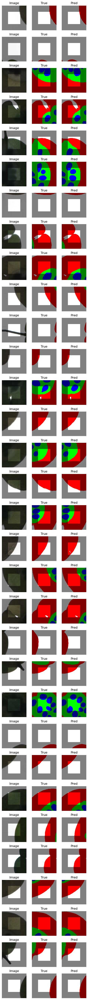

In [19]:
# options
num_plot = 32

# get batch from val set for plotting
val_loader = DataLoader(val_generator, batch_size=num_plot, shuffle=True)
for xb, yb in val_loader:
    xb, yb = xb.to(device), yb.to(device)
    break

# make prediction with unet
yb_pred = model(xb)

# convert to cpu, numpy, and change channels for visualization
xb_numpy = xb.detach().cpu().permute(0, 2, 3, 1).numpy()
yb_numpy = yb.detach().cpu().permute(0, 2, 3, 1).numpy()[:, :, :, 1:]
yb_pred_numpy = yb_pred.detach().cpu().permute(0, 2, 3, 1).numpy()

# convert predicted probabilities to predicted classes and retain four channels
yb_pred_numpy = np.argmax(yb_pred_numpy, axis=3)
preds = np.zeros(yb_pred_numpy.shape + (4,))
for i in range(4):
    preds[:, :, :, i] = yb_pred_numpy == i
yb_pred_numpy = preds[:, : , :, 1:]

yb_numpy[yb_numpy.sum(3) == 0] = 1
yb_pred_numpy[yb_pred_numpy.sum(3) == 0] = 1

context = np.zeros((tile_size, tile_size, 4))
context[:tile_size//4, :, -1] = 0.5
context[-tile_size//4:, :, -1] = 0.5
context[:, :tile_size//4, -1] = 0.5
context[:, -tile_size//4:, -1] = 0.5

# plot images and masks
fig = plt.figure(figsize=(5, 5/3*num_plot))
for i in range(num_plot):
    ax = fig.add_subplot(num_plot, 3, 3*i+1)
    ax.imshow(xb_numpy[i]); ax.set_title('Image'); ax.axis('off')
    ax.imshow(context)
    ax = fig.add_subplot(num_plot, 3, 3*i+2)
    ax.imshow(yb_numpy[i]); ax.set_title('True'); ax.axis('off')
    ax.imshow(context)
    ax = fig.add_subplot(num_plot, 3, 3*i+3)
    ax.imshow(yb_pred_numpy[i]); ax.set_title('Pred'); ax.axis('off')
    ax.imshow(context)
plt.tight_layout()
plt.show()

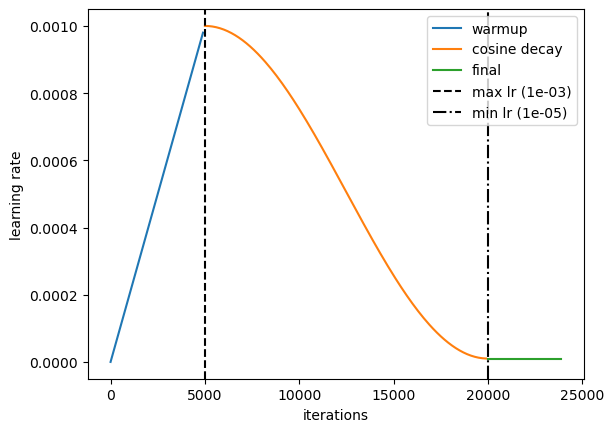

In [58]:
import math

# options
warmup_iters = 5000 # number of iterations to reach max learning rate
lr_decay_iters = 20000 # number of iterations to reach min learning rate
max_lr = 1e-3
min_lr = 1e-5

def get_lr(it):
    if it < warmup_iters:
        return max_lr * it / warmup_iters
    if it > lr_decay_iters:
        return min_lr
    decay_ratio = (it - warmup_iters) / (lr_decay_iters - warmup_iters)
    assert 0 <= decay_ratio <= 1
    coeff = 0.5 * (1.0 + math.cos(math.pi * decay_ratio)) # coeff ranges 0..1
    return min_lr + coeff * (max_lr - min_lr)

fig, ax = plt.subplots()
x = np.arange(0, warmup_iters, 100)
ax.plot(x, [get_lr(i) for i in x], label='warmup')
x = np.arange(warmup_iters, lr_decay_iters, 100)
ax.plot(x, [get_lr(i) for i in x], label='cosine decay')
x = np.arange(lr_decay_iters, int(1.2*lr_decay_iters), 100)
ax.plot(x, [get_lr(i) for i in x], label='final')
ax.axvline(warmup_iters, color='k', linestyle='--', label=f'max lr ({max_lr:1.0e})')
ax.axvline(lr_decay_iters, color='k', linestyle='-.', label=f'min lr ({min_lr:1.0e})')
plt.xlabel('iterations')
plt.ylabel('learning rate')
plt.legend()
plt.show()

In [13]:
#
# test timing
#

# init
batch_size = 64
n_batches = 10
workers = 16
loader = DataLoader(
    train_generator, 
    batch_size=batch_size, 
    num_workers=workers)

# next iter approach
start = time.time()
for _ in range(n_batches):
    batch = next(iter(loader))
next_iter = time.time() - start
print(f'Next iter: {next_iter:.2f}s')

# for loop approach
start = time.time()
for i, batch in enumerate(loader):
    if i == n_batches - 1: break
for_loop = time.time() - start
print(f'For loop:  {for_loop:.2f}s')

Next iter: 9.03s
For loop:  1.04s


# Build model

In [5]:
# options
input_features = 3
output_features = 4
layers = [32, 64, 128]
n_convs = 1

# instantiate model
model = BuildUNet(
        input_features=input_features,
        output_features=output_features,
        layers=layers,
        hidden_activation=torch.nn.LeakyReLU(),
        output_activation=torch.nn.Softmax(dim=1),
        n_convs=n_convs,
        use_batchnorm=True,
        dropout_rate=0.1)
model = model.to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)
loss_function = torch.nn.BCELoss()

# Train model

In [6]:
# options 
batch_size = 32
max_iters = 100000
log_interval = 1 # iterations between logging batch statistics
batches_per_eval = 100 # batches used to estimate eval loss
eval_interval = 100 # checkpointing interval
early_stop = 10 # stop if eval loss does not improve
n_workers = 32 # number of workers for data loader
log_path = 'data/logs/log.csv'
chckpnt_path = 'data/checkpoints/checkpoint_{0}.pt'
iter_update = 'step {0}: train loss {1:.4e}, val loss {2:.4e}\r'

# init
best_val_loss = None # initialize best validation loss
t0 = time.time() # start timer
last_improved = 0 # start early stopping counter

# training loop
for iter_num in range(max_iters+1): # loop over iterations (not epochs)

    # during the first iteration, create a log file for book keeping
    if iter_num == 0:
        with open(log_path, 'w') as f: 
            f.write('iter,train_loss,val_loss\n')

    #
    # checkpoint
    #

    # at each eval_interval, evaluate the model and shuffle the dataloaders
    if iter_num % eval_interval == 0:

        # shuffle dataloaders
        train_loader = DataLoader(
            train_generator, 
            batch_size=batch_size, 
            shuffle=True,
            num_workers=n_workers)
        val_loader = DataLoader(
            val_generator, 
            batch_size=batch_size, 
            shuffle=True,
            num_workers=n_workers)

        # estimate loss
        model.eval()
        with torch.no_grad():
            train_loss, val_loss = 0, 0
            for i in tqdm(range(batches_per_eval), desc='Estimating loss'):
                xb, yb = next(iter(train_loader))
                xb, yb = xb.to(device), yb.to(device)
                train_loss += loss_function(model(xb), yb).item()
                xb, yb = next(iter(val_loader))
                xb, yb = xb.to(device), yb.to(device)
                val_loss += loss_function(model(xb), yb).item()
            train_loss /= batches_per_eval
            val_loss /= batches_per_eval
        model.train()

        # update user
        print(iter_update.format(iter_num, train_loss, val_loss)) 

        # update log
        with open(log_path, 'a') as f: 
            f.write(f'{iter_num},{train_loss},{val_loss}\n')

        # checkpoint model (store model, optimizer, metadata, etc.)
        if iter_num > 0:
            checkpoint = {
                'model': model.state_dict(),
                'optimizer': opt.state_dict(),
                'iter_num': iter_num,
                'best_val_loss': best_val_loss,
                'train_ids': train_idx,
                'val_ids': val_idx,
            }
            torch.save(checkpoint, chckpnt_path.format(iter_num))

        # updates
        if best_val_loss is None:
            best_val_loss = val_loss
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            last_improved = 0
            print(f'*** validation loss improved: {best_val_loss:.4e} ***')
        else:
            last_improved += 1
            print(f'validation has not improved in {last_improved} steps')

        # early stopping
        if last_improved > early_stop:
            print()
            print(f'*** no improvement for {early_stop} steps, stopping ***')
            break

    #
    # backprop
    #

    # generate a batch of training data
    xb, yb = next(iter(train_loader))
    xb, yb = xb.to(device), yb.to(device)

    # compute the loss
    loss = loss_function(model(xb), yb)

    # kill training if loss is NaN
    if torch.isnan(loss):
        print('loss is NaN, stopping')
        break

    # update weights
    loss.backward()
    optimizer.step()
    optimizer.zero_grad(set_to_none=True)

    # evaluate timing
    t1 = time.time() # get current time
    dt = (t1 - t0) / log_interval # compute time per iteration
    t0 = t1 # reset timer

    # update user with batch statistics
    if iter_num % log_interval == 0:
        print(f'iter {iter_num}: loss {loss:.4e}, time {dt*1000:.2f}ms', end='\r')

Estimating loss:   0%|          | 0/100 [00:00<?, ?it/s]

Traceback (most recent call last):
  File "/home/4ml/Libraries/dgx/anaconda/envs/pytorch/lib/python3.11/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/home/4ml/Libraries/dgx/anaconda/envs/pytorch/lib/python3.11/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/4ml/Libraries/dgx/anaconda/envs/pytorch/lib/python3.11/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/home/4ml/Libraries/dgx/anaconda/envs/pytorch/lib/python3.11/shutil.py", line 738, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/home/4ml/Libraries/dgx/anaconda/envs/pytorch/lib/python3.11/shutil.py", line 736, in rmtree
    os.rmdir(path, dir_fd=dir_fd)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-pa1pq63w'
Traceback (most recent call last):
  File "/home/4ml/Libraries/dgx/anaconda/envs/pytorch/lib/python3.11/multiproc

KeyboardInterrupt: 

In [ ]:
# approximate train and validation loss using multiple batches
@torch.no_grad()
def estimate_loss():
    model.eval()
    train_loss, val_loss = 0, 0
    for _ in tqdm(range(n_batch_per_eval)):
        idx = torch.randint(len(train_pixels), (eval_batch_size,))
        x, y = get_batch('train', idx)
        train_loss += loss_function(model(x), y).item()
        idx = torch.randint(len(val_pixels), (eval_batch_size,))
        x, y = get_batch('val', idx)
        val_loss += loss_function(model(x), y).item()
    train_loss /= n_batch_per_eval
    val_loss /= n_batch_per_eval
    model.train()
    return train_loss, val_loss

In [ ]:
from torch.utils.data import DataLoader

# options
batch_size = 64
workers = 8

# build batch loader
def get_batch(split):

    # get tile generator
    if split == 'train': dataset = train_dataset
    if split == 'val': dataset = val_dataset

    # make local DataLoader
    loader = DataLoader(
        dataset, 
        batch_size=batch_size, 
        shuffle=True, 
        num_workers=workers)

    # load batch on CPU
    xb, yb = next(iter(loader))

    # move to GPU (if cuda, pin memory for faster transfer)
    if 'cuda' in device.type:
        xb = xb.pin_memory().to(device, non_blocking=True)
        yb = yb.pin_memory().to(device, non_blocking=True)
    else:
        xb = xb.to(device)
        yb = yb.to(device)

    return xb, yb

In [7]:
class BuildCNN(torch.nn.Module):
    
    def __init__(self, 
                 input_channels, # <- number of input channels (R, G, B = 3)
                 layers, # <- list of layer sizes
                 num_convs=3, # <- number of convs per block
                 dropout_rate=0.0): # <- dropout rate
        
        # initialization
        super().__init__()
        self.input_channels = input_channels
        self.layers = layers
        self.activation = torch.nn.LeakyReLU()
        self.num_convs = num_convs
        self.dropout_rate = dropout_rate
        
        # instantiation
        self.conv_list = torch.nn.ModuleList()
        self.norm_list = torch.nn.ModuleList()
        self.drop_list = torch.nn.ModuleList()
        self.pool_list = torch.nn.ModuleList()
        
        # loop over blocks
        for i, layer in enumerate(self.layers): 
            
            # loop over convs
            for j in range(self.num_convs): 
                
                # add conv 
                self.conv_list.append(torch.nn.Conv2d(
                    in_channels=input_channels,
                    out_channels=layer,
                    kernel_size=3,
                    stride=1,
                    padding=1))
                
                # add optional batchnorm
                self.norm_list.append(torch.nn.BatchNorm2d(layer))

                # add optinal dropout
                if self.dropout_rate > 0:
                    self.drop_list.append(torch.nn.Dropout2d(p=self.dropout_rate))
                    
                # update book keeping
                input_channels = layer
            
            # add pooling layer
            if i != len(self.layers)-1:
                self.pool_list.append(torch.nn.MaxPool2d(kernel_size=2, stride=2))
        
    def forward(self, x):
        
        # loop over blocks
        for i in range(len(self.layers)): 
            
            # loop over convs
            for j in range(self.num_convs): 
                       
                # store input for residual connection
                if j > 0:
                    x_copy = x.clone()
                
                # add conv 
                x = self.conv_list[i*self.num_convs + j](x)
                
                # add optional batchnorm
                x = self.norm_list[i*self.num_convs + j](x)
                
                # add activation
                x = self.activation(x)

                # add optinal dropout
                if self.dropout_rate > 0:
                    x = self.drop_list[i*self.num_convs + j](x)
                       
                # apply residual connection
                if j > 0:
                    x = x + x_copy
                    
            # add pooling layer
            if i != len(self.layers)-1:
                x = self.pool_list[i](x)
        
        return x

In [8]:
class Grower(torch.nn.Module):
    
    def __init__(self, 
                 input_channels, # <- number of input channels (R, G, B = 3)
                 output_shape, # <- number of output channels (1, 3, 3)
                 layers, # <- list of layer sizes
                 num_convs=3, # <- number of convs per block
                 dropout_rate=0.0): # <- dropout rate
        
        super().__init__()
        self.output_shape = output_shape
        self.cnn = BuildCNN(input_channels, layers, num_convs, dropout_rate)
        self.conv = torch.nn.Conv2d(
            in_channels=layers[-1],
            out_channels=np.prod(self.output_shape),
            kernel_size=int(tile_size/2**(len(layers)-1)),
            stride=1,
            padding=0,
            bias=True)
        self.activation = torch.nn.Sigmoid()
        
    def forward(self, x):

        x = self.cnn(x) # [B, C, H, W] -> [B, 128, 4, 4]
        x = self.conv(x) # [B, 128, 4, 4] -> [B, 9, 1, 1]
        x = x.view(-1, *self.output_shape) # [B, 9, 1, 1] -> [B, 3, 3]
        x = self.activation(x)

        return x

In [9]:
# options
input_channels = 3
output_shape = [3, 3]
layers = [32, 32, 32, 32, 64, 128]
num_convs = 3
dropout_rate = 0.1
save_name = 'pennycress_vein_cnn_bce_nobackground'

# focal loss
gamma, alpha = 2.0, 0.25
def focal_loss(pred, target):
    pred = pred.clamp(min=1e-7, max=1.0-1e-7)
    pt_1 = torch.where(target == 1, pred, torch.ones_like(pred))
    pt_0 = torch.where(target == 0, pred, torch.zeros_like(pred))
    out = -torch.mean(alpha*((1.0 - pt_1)**gamma)*torch.log(pt_1))
    out = out - torch.mean((1.0 - alpha)*(pt_0**gamma)*torch.log(1.0 - pt_0))
    return out

# wrap model
cnn = Grower(
    input_channels=input_channels,
    output_shape=output_shape,
    layers=layers,
    num_convs=num_convs,
    dropout_rate=dropout_rate,
).to(device)
opt = torch.optim.AdamW(cnn.parameters(), lr=1e-3)
model = MW.ModelWrapper(
    model=cnn,
    optimizer=opt,
    loss=torch.nn.BCELoss(),
    save_name=f'../weights/{save_name}',
    log_name=f'../logs/{save_name}.txt',
    device=device)

In [10]:
# options
epochs = 1000
batch_size = 1024
workers = 64
early_stopping = 15
steps_per_epoch = 100
validation_steps = 250

# do the thing
model.fit(
    train_dataset=train_dataset,
    validation_dataset=val_dataset,
    batch_size=batch_size,
    epochs=epochs,
    early_stopping=early_stopping,
    verbose=2,
    workers=workers, 
    steps_per_epoch=steps_per_epoch, # <- number of batches per epoch
    validation_steps=validation_steps, # <- number of batches per validation
)

Epoch    1 4772/4772 | Train loss = 3.1471e-01 | Val loss = 3.0758e-01 *                 
Epoch    2 4772/4772 | Train loss = 2.9836e-01 | Val loss = 3.1366e-01                 
Epoch    3 4772/4772 | Train loss = 2.9854e-01 | Val loss = 3.0716e-01 *                 
Epoch    4 4772/4772 | Train loss = 2.9121e-01 | Val loss = 2.9836e-01 *                 
Epoch    5 4772/4772 | Train loss = 2.7507e-01 | Val loss = 2.3110e-01 *                 
Epoch    6 4772/4772 | Train loss = 2.4381e-01 | Val loss = 2.0098e-01 *                 
Epoch    7 4772/4772 | Train loss = 2.2318e-01 | Val loss = 1.8341e-01 *                 
Epoch    8 4772/4772 | Train loss = 2.1263e-01 | Val loss = 1.7066e-01 *                 
Epoch    9 4772/4772 | Train loss = 2.0292e-01 | Val loss = 1.7374e-01                 
Epoch   10 4772/4772 | Train loss = 1.9506e-01 | Val loss = 1.6117e-01 *                 
Epoch   11 4772/4772 | Train loss = 1.8871e-01 | Val loss = 1.6460e-01                 
Epoch   12 4772/

# Evaluate model

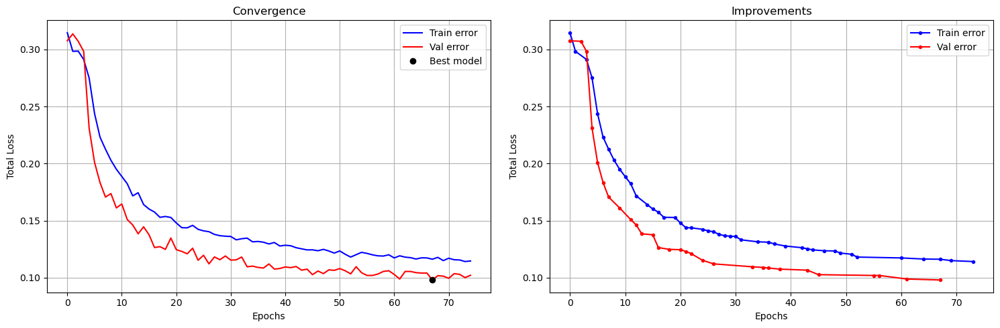

In [10]:
rel_save_thresh = 0.0

# load errors
with open(model.log_name, 'r') as f:
    lines = [l.split(',') for l in f.read().split('\n')[1:-1]]
    total_train_losses = [float(l[1]) for l in lines]
    total_val_losses = [float(l[2]) for l in lines]

# find where errors decreased
train_idx, train_loss, val_idx, val_loss = [], [], [], []
best_train, best_val = 1e12, 1e12
for i in range(len(total_train_losses)):
    rel_diff = (best_train - total_train_losses[i])
    rel_diff /= best_train
    if rel_diff > rel_save_thresh:
        best_train = total_train_losses[i]
        train_idx.append(i)
        train_loss.append(best_train)
    rel_diff = (best_val - total_val_losses[i])
    rel_diff /= best_val
    if rel_diff > rel_save_thresh:
        best_val = total_val_losses[i]
        val_idx.append(i)
        val_loss.append(best_val)
idx = np.argmin(val_loss)

# plot errors and improvements
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(1, 2, 1)
plt.plot(total_train_losses, 'b')
plt.plot(total_val_losses, 'r')
plt.plot(val_idx[idx], val_loss[idx], 'ko')
plt.legend([r'Train error', r'Val error', 'Best model'])
plt.xlabel(r'Epochs')
plt.ylabel(r'Total Loss')
plt.title(r'Convergence')
plt.grid()
ax = fig.add_subplot(1, 2, 2)
plt.plot(train_idx, train_loss, 'b.-')
plt.plot(val_idx, val_loss, 'r.-')
plt.legend([r'Train error', r'Val error'])
plt.xlabel('Epochs')
plt.ylabel(r'Total Loss')
plt.title(r'Improvements')
plt.grid()
plt.tight_layout(h_pad=2, w_pad=2)
plt.show()

In [11]:
class PredGenerator(Dataset):
    
    def __init__(self, image, indices, w):
        
        super().__init__()
        self.image = image # [C, H, W] torch tensor
        self.indices = indices # [N, 2] numpy array
        self.w = w # tile size / 2
                
    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, index):
        idx = torch.tensor(self.indices[index], dtype=torch.long)
        r, c = idx[0], idx[1]
        w = self.w
        x = self.image[:, r-w:r+w, c-w:c+w].copy()
        x = torch.tensor(x, dtype=torch.float32)
        return idx, x

class RegionGrower():
    
    def __init__(
        self, 
        model, 
        tile_size, 
        device=None, 
        verbose=False):
        
        super().__init__()
        self.tile_size = tile_size
        self.model = model
        self.device = device
        self.verbose = verbose
        
    # swap image axes [H, W, C] -> [C, H, W]
    def channels_first(self, image):
        return np.swapaxes(np.swapaxes(image, 0, 2), 1, 2)
    
    # swap image axes [C, H, W] -> [H, W, C]
    def channels_last(self, image):
        return np.swapaxes(np.swapaxes(image, 0, 2), 0, 1)
        
    def grow(
        self, 
        image, 
        roi=None, 
        start_locs=None, 
        n_locs=10000, 
        batch_size=1024, 
        threshold=0.5):
        
        # pad image and mask with zeros
        w, w2 = self.tile_size, int(self.tile_size/2)
        image = np.pad(image, [[w, w], [w, w], [0, 0]], 'reflect').copy()
        if roi is not None:
            roi = np.pad(roi, [[w, w], [w, w]], 'constant', constant_values=0).copy()
            
        # reorder image channels
        image = self.channels_first(image) # [H, W, c] -> [C, H, W]
        
        # initialize book keeping
        pixel_probs = np.zeros(image.shape[1:])
        pixel_counts = np.zeros_like(pixel_probs)
        sample = np.zeros_like(pixel_probs)
        unconsidered = np.zeros_like(pixel_probs)
        unconsidered[w:-w, w:-w] = 1 # don't consider padding

        # initialize sample
        if start_locs is None:
            if roi is None:
                i = np.random.choice(image.shape[1] - 2*w, n_locs) + w
                j = np.random.choice(image.shape[2] - 2*w, n_locs) + w
                start_locs = np.concatenate([i[:, None], j[:, None]], axis=1)
            else:
                start_locs = np.argwhere(roi == 1) # [N+, 2]
                p = np.random.permutation(len(start_locs))
                start_locs = start_locs[p[:n_locs]] # [N, 2]
        sample[start_locs[:, 0], start_locs[:, 1]] = 1
            
        # initialize sample locations
        locs = np.argwhere(unconsidered*sample == 1)
        
        # predict until no more sample locations
        count = 0
        while len(locs) != 0:
            
            # instantiate data generator for current locations
            tile_generator = PredGenerator(image, locs, w2)
            tile_batch_loader = DataLoader(tile_generator, 
                                           batch_size=batch_size, 
                                           shuffle=False, 
                                           num_workers=0)
            
            # loop over batches indices/tiles
            for idx_batch, tile_batch in tile_batch_loader:
                
                # make model prediction
                idx_batch = idx_batch.detach().cpu().numpy() # [B, 2]
                tile_batch = tile_batch.to(self.device) # [B, C, H, W]
                with torch.no_grad():
                    pred_batch = self.model(tile_batch).detach().cpu().numpy()
                
                # update mask, sample, and unconsidered
                for idx, prob in zip(idx_batch, pred_batch):
                    r, c = idx[0], idx[1]
                    pixel_probs[r-1:r+2, c-1:c+2] += prob
                    pixel_counts[r-1:r+2, c-1:c+2] += 1
                    unconsidered[r, c] = 0
                    sample[r-1:r+2, c-1:c+2] = 1.0*(prob > 0.2)
                
            # update sample and locations
            locs = np.argwhere(unconsidered*sample == 1)
            
            # update user
            if self.verbose:
                p = '\rIteration {0}'.format(count)
                p += ' | Samples = {0}'.format(len(locs))
                p += '           '
                sys.stdout.write(p)
            
            # update counter
            count += 1
            
        if self.verbose:
            print()
        
        # normalize mask probabilities by pixel counts (avoid divide by zero)
        probs = pixel_probs / pixel_counts.clip(1)
        
        # threshold probabilities for mask
        mask = probs > threshold
            
        # remove padding
        probs = probs[w:-w, w:-w]
        mask = mask[w:-w, w:-w]
        
        return probs, mask

Iteration 58 | Samples = 0              
Iteration completed in 47.86 seconds
Plotting overlay...


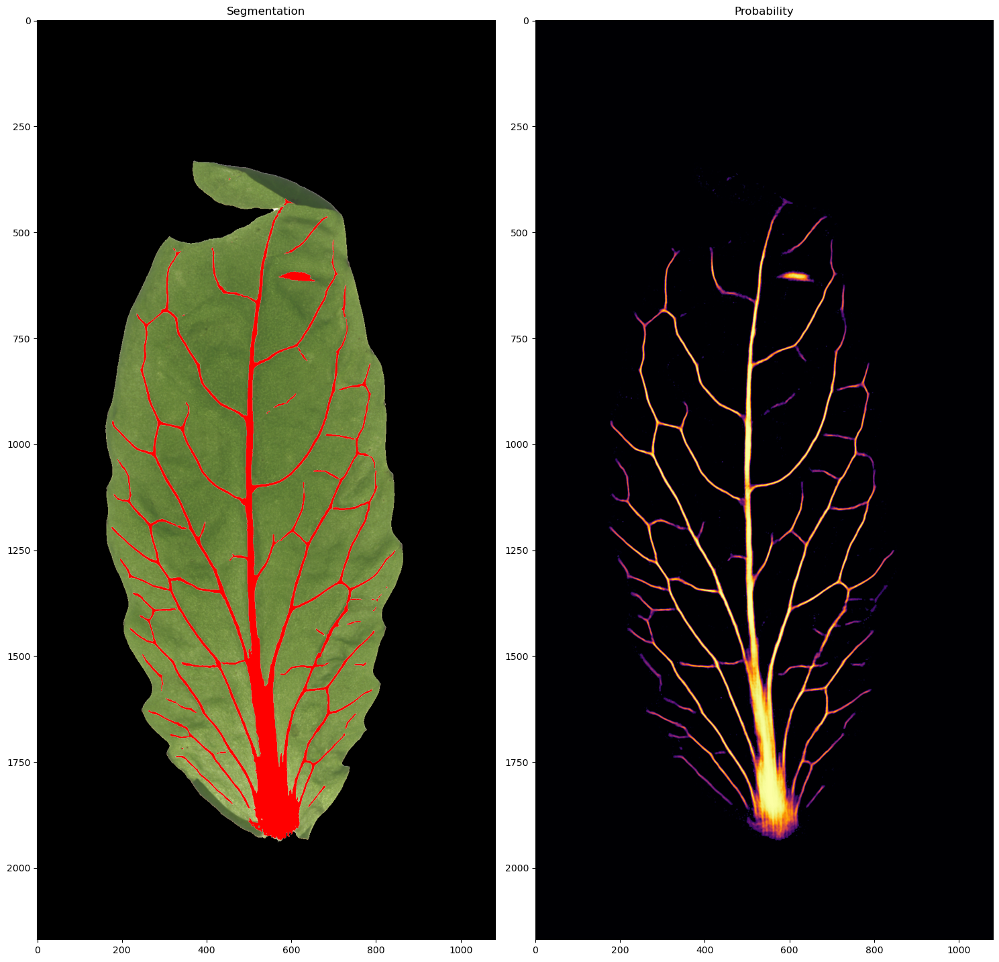

Iteration 61 | Samples = 0              
Iteration completed in 51.99 seconds
Plotting overlay...


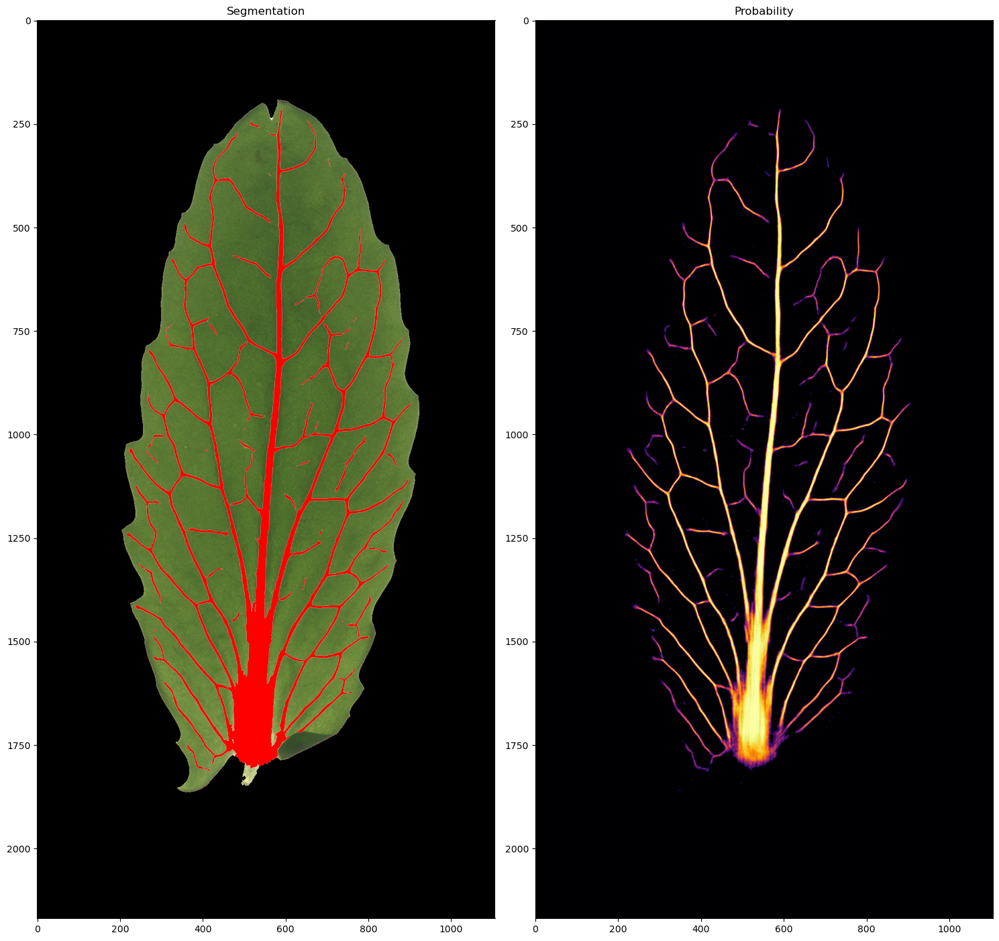

Iteration 38 | Samples = 0              
Iteration completed in 43.79 seconds
Plotting overlay...


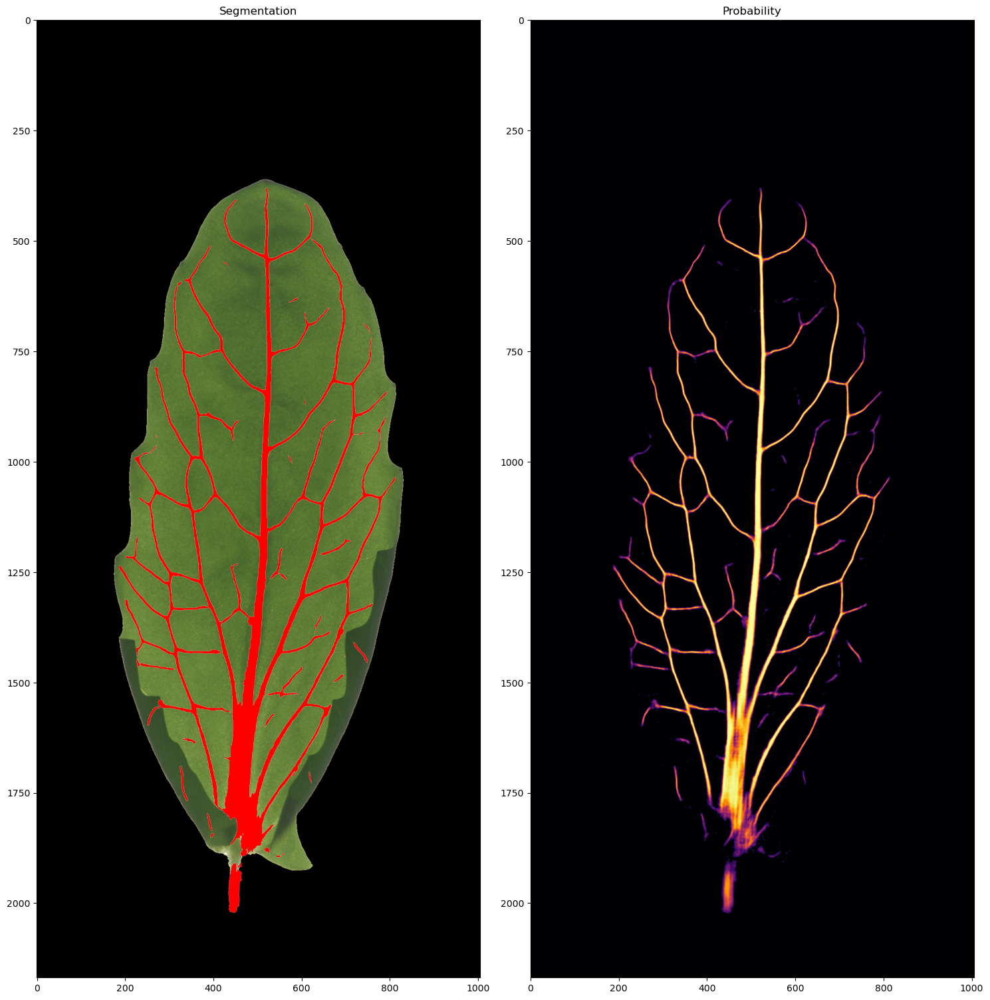

Iteration 72 | Samples = 0              
Iteration completed in 70.02 seconds
Plotting overlay...


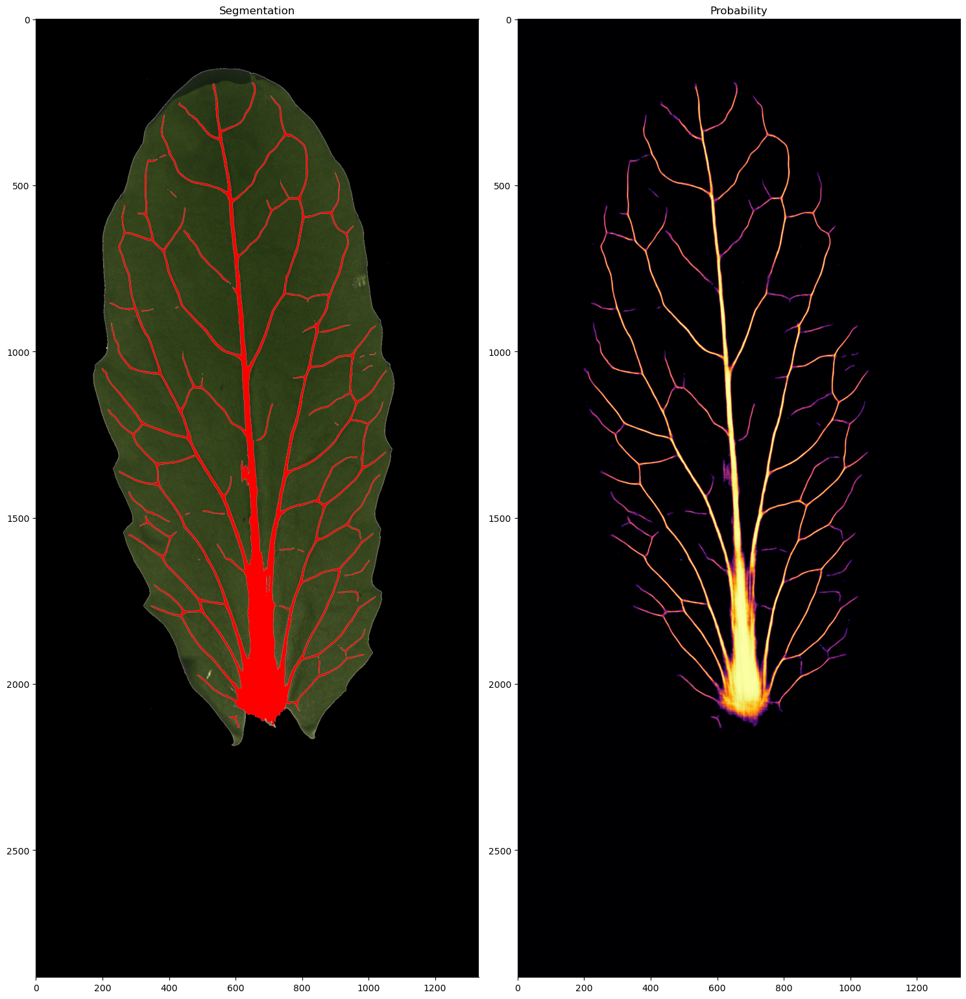

Iteration 101 | Samples = 0             
Iteration completed in 85.47 seconds
Plotting overlay...


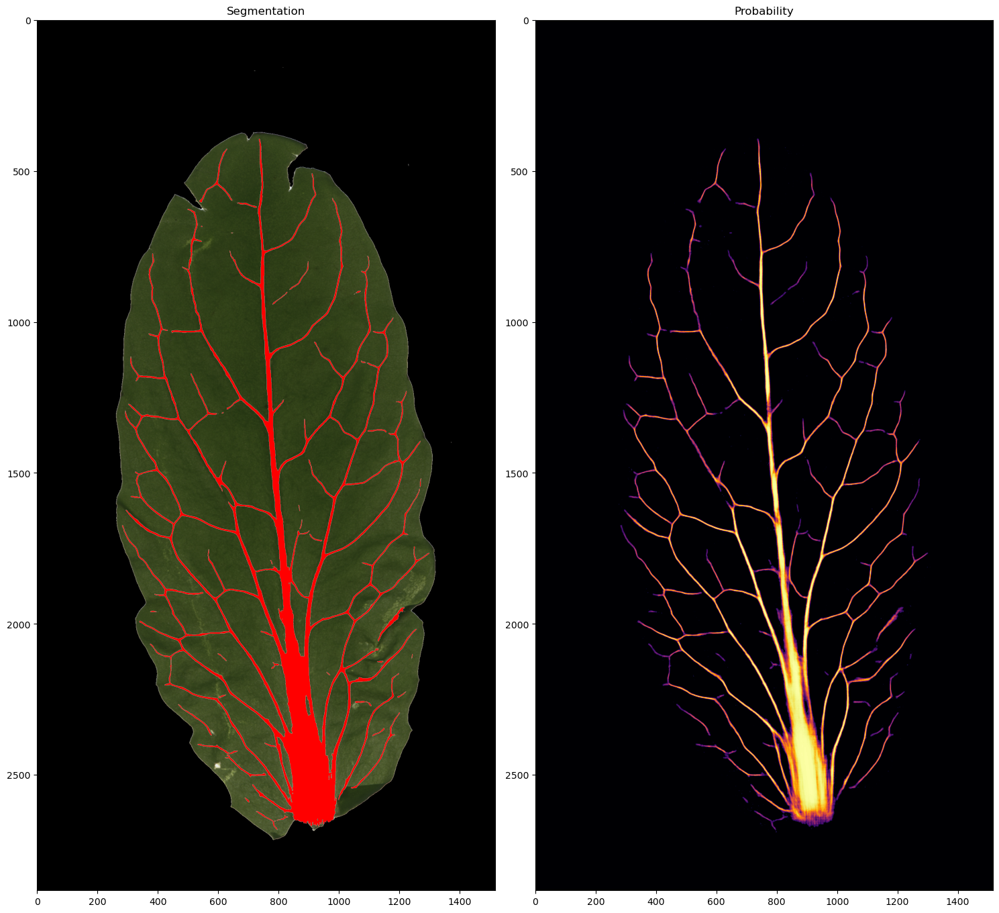

In [13]:
# options
n_locs = 10000 # number of seed pixels
batch_size = 1024
threshold = 0.2
verbose = True
fig_size = 7.5

# load model
model.load_best_val()
grower = RegionGrower(model.model, tile_size=tile_size, device=device, verbose=verbose)

# load test image
image_names = [os.path.basename(f) for f in glob.glob(image_path + '*.png')]
mask_names = [os.path.basename(f) for f in glob.glob(mask_path + '*.png')]
test_names = sorted([i for i in image_names if i not in mask_names])

for test_name in test_names:

    # load image
    test_image = Image.open(image_path + test_name)
    test_image = np.array(test_image)[:, :, :3] / 255
    test_image = np.pad(test_image, ((pad, pad), (pad, pad), (0, 0)), 'edge')

    # compute rough roi
    test_gray = test_image.mean(axis=2)
    test_mask = test_gray < 0.75
    test_mask = ndimage.binary_dilation(test_mask, iterations=3)
    test_mask = ndimage.binary_fill_holes(test_mask)
    test_mask = ndimage.binary_erosion(test_mask, iterations=3)

    # kill background pixels
    test_image[~test_mask] = 0

    # segment the roots
    t0 = time.time()
    prob, pred = grower.grow(
        image=test_image, 
        roi=test_mask,
        start_locs=None,
        n_locs=n_locs, 
        batch_size=batch_size, 
        threshold=threshold)
    t1 = time.time()
    if verbose:
        print('Iteration completed in {0:1.2f} seconds'.format(t1-t0))

    # plot overlay
    if verbose: 
        print('Plotting overlay...')
    nrows, ncols = pred.shape
    fig, axs = plt.subplots(1, 2, figsize=(2*fig_size, nrows/ncols*figsize))
    axs[0].imshow(test_image)
    apply_overlay(axs[0], pred, [1, 0, 0], alpha=1)
    axs[0].set_title('Segmentation')
    axs[1].imshow(prob, cmap='inferno')
    axs[1].set_title('Probability')
    plt.tight_layout()
    plt.show()

# Archive: image pre-processing

  0%|          | 0/22 [00:00<?, ?it/s]

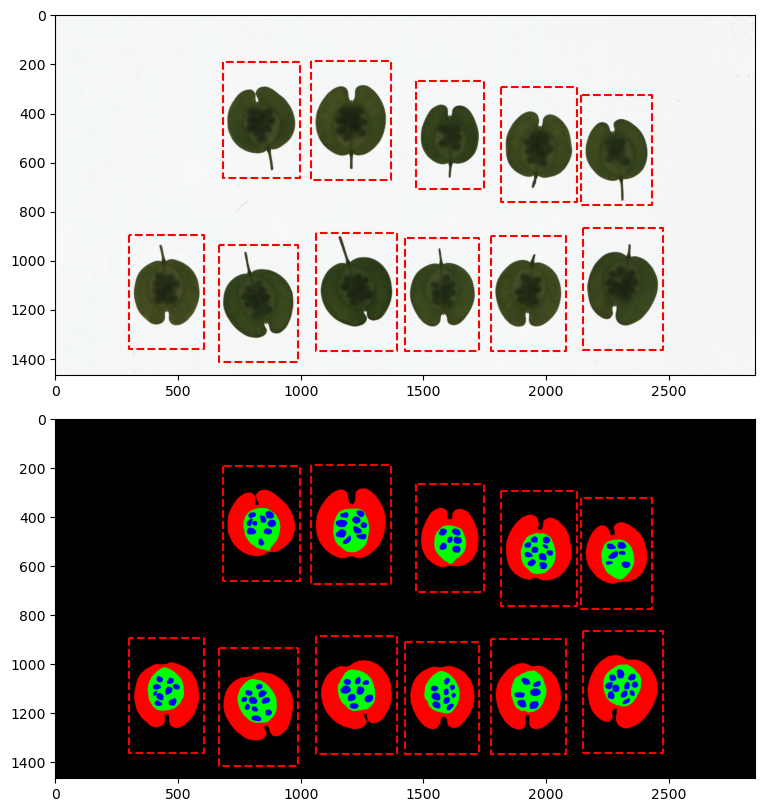

  0%|          | 0/11 [00:00<?, ?it/s]

In [ ]:
image = (255*images[0].copy()).astype(np.uint8)
mask = masks[0].copy()
seed = seeds[0].copy()
name = image_names[0]
figsize = 8

# fill seeds
seed = ndimage.binary_fill_holes(seed)

# split the mask into wings and seed pods
skeleton = skeletonize(mask)
skeleton = ndimage.binary_dilation(skeleton, iterations=1)
mask = ndimage.binary_fill_holes(mask)
mask = ~skeleton * mask
mask = ndimage.label(mask)[0]

# if the center of mass is in the mask (i.e., seed pod), remove it, leaving only the wings
coms = ndimage.center_of_mass(mask, mask, range(1, mask.max()+1))
wings, pods = np.zeros_like(mask), np.zeros_like(mask)
for label in tqdm(range(1, mask.max()+1)):
    c = np.array([int(c) for c in coms[label-1]])
    l = mask == label
    idx = np.argwhere(l)
    if ((idx[:, 0] == c[0]) * (idx[:, 1] == c[1])).any():
        pods[idx[:, 0], idx[:, 1]] = 1
    else:
        wings[idx[:, 0], idx[:, 1]] = 1

# dilate wings and pods to account for skeletonization
pod_boundary = skeleton * ndimage.binary_dilation(pods, iterations=2)
pods = pods + pod_boundary
wing_boundary = skeleton * ndimage.binary_dilation(wings, iterations=1)
wings = wings + wing_boundary

# remove seeds from seed pods
pods = ~seed * pods

# make RGB out of wing + pod + seed
mask = np.concatenate([wings[:, :, None], pods[:, :, None], seed[:, :, None]], axis=2)
mask = (255*mask).astype(np.uint8)

# get bounding boxes around each wing
labels = ndimage.label(wings)[0]
bboxes = ndimage.find_objects(labels)
x_pad, y_pad = 100, 20
for i in range(len(bboxes)):
    x, y = bboxes[i]
    bboxes[i] = slice(x.start-x_pad, x.stop+x_pad), slice(y.start-y_pad, y.stop+y_pad)

fig, axs = plt.subplots(2, 1, figsize=(figsize, 2*nrows/ncols*figsize))
axs[0].imshow(image)
axs[1].imshow(mask)
for bbox in bboxes:
    y, x = bbox
    axs[0].plot([x.start, x.start, x.stop, x.stop, x.start], [y.start, y.stop, y.stop, y.start, y.start], '--', color='r')
    axs[1].plot([x.start, x.start, x.stop, x.stop, x.start], [y.start, y.stop, y.stop, y.start, y.start], '--', color='r')
plt.tight_layout()
plt.show()

# save images and masks by pod
pod_names = 'abcdefghijklmnopqrstuvwxyz'
for i in tqdm(range(len(bboxes))):
    x, y = bboxes[i]
    image_ = image[x, y]
    mask_ = mask[x, y]
    Image.fromarray(image_).save('../data/raw/pod_segmentation/images_by_pod/' + name.replace('.png', f' pod_{pod_names[i]}.png'))
    Image.fromarray(mask_).save('../data/raw/pod_segmentation/masks_by_pod/' + name.replace('.png', f' pod_{pod_names[i]}.png'))

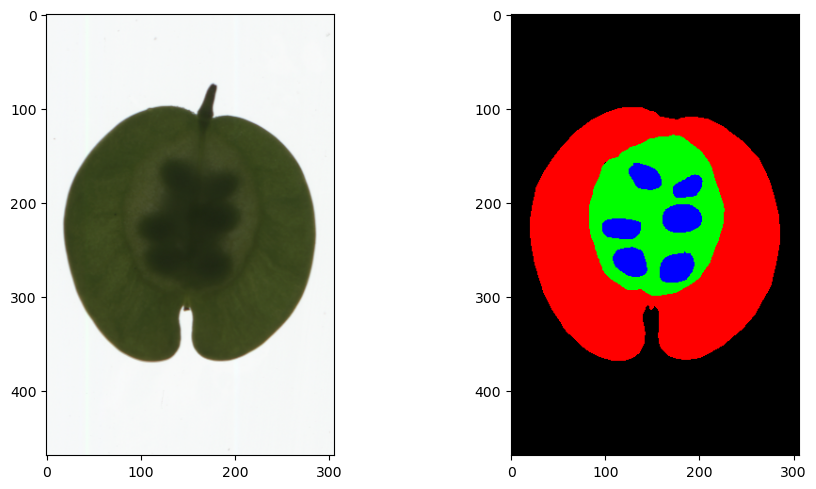

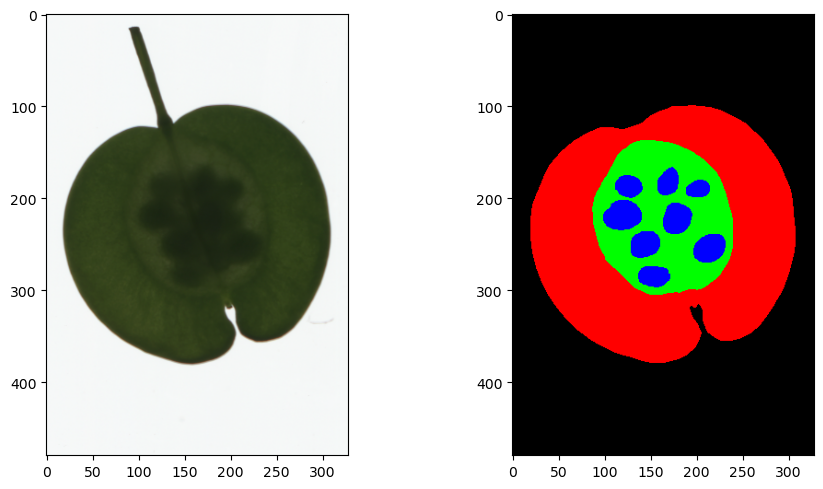

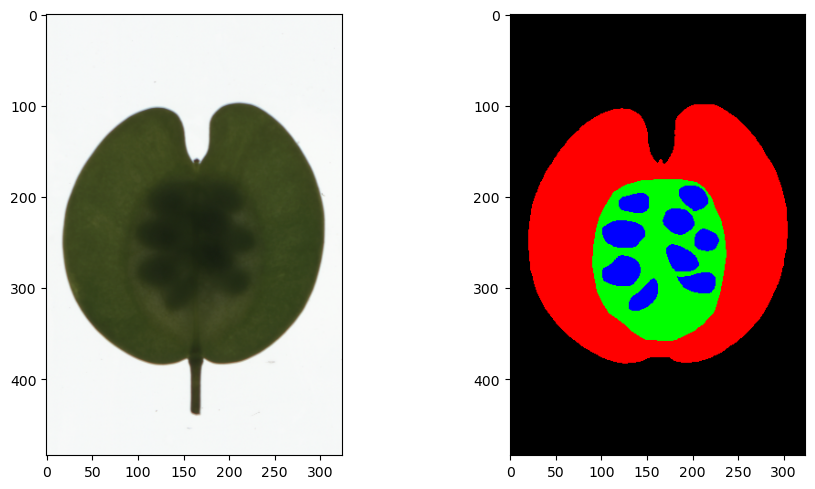

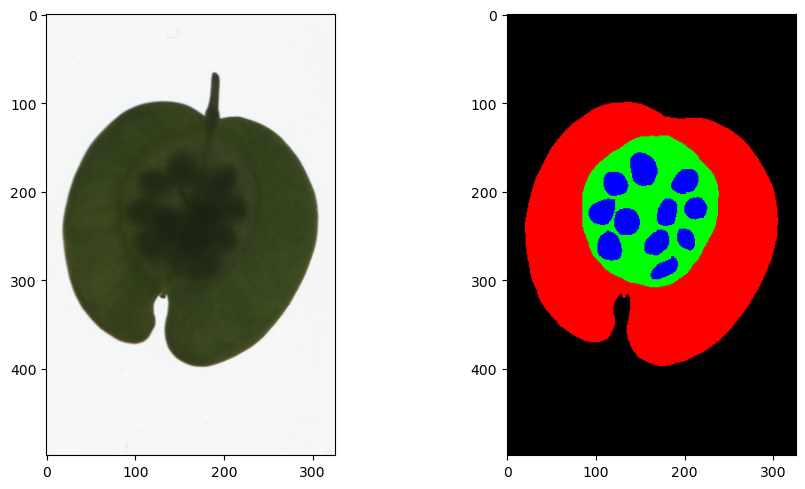

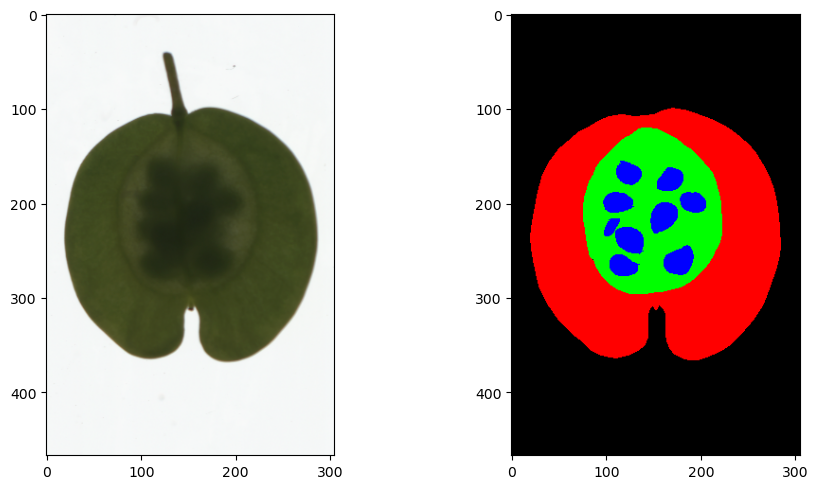

...

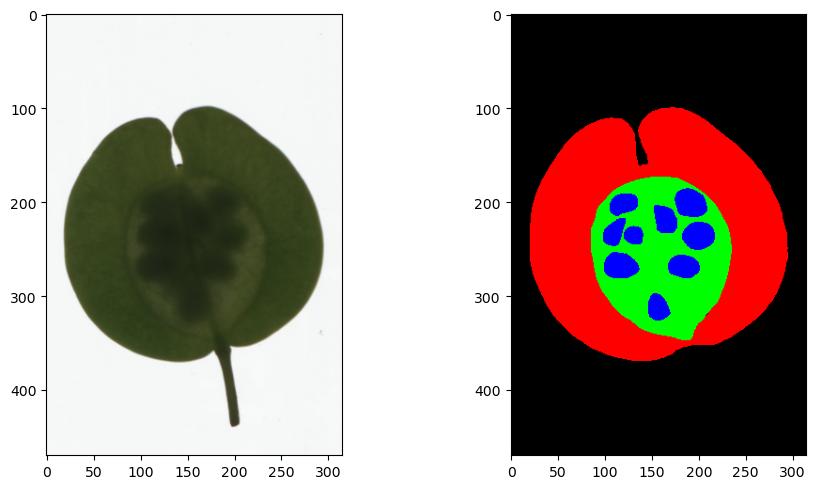

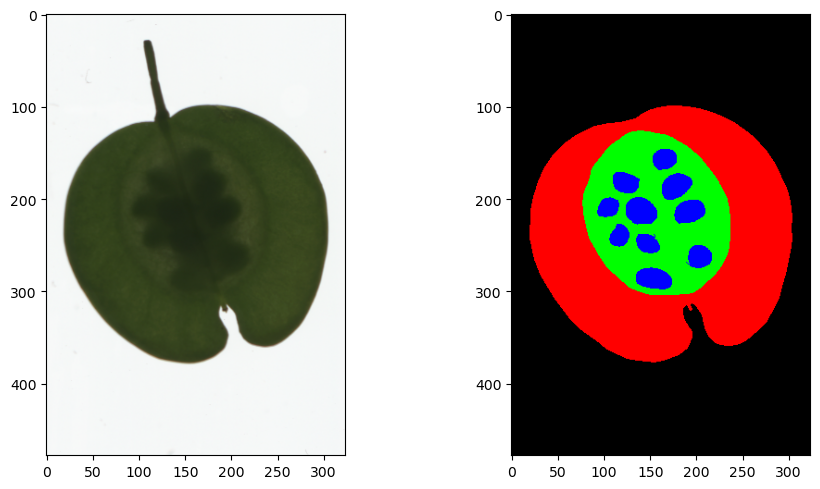

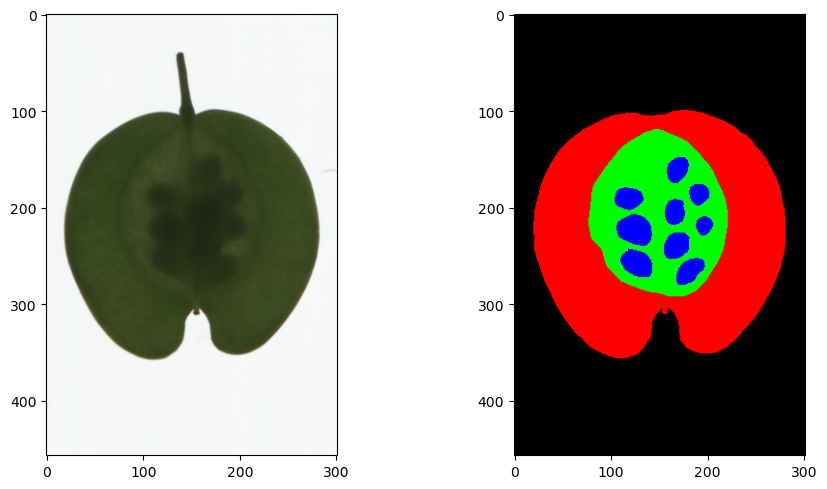

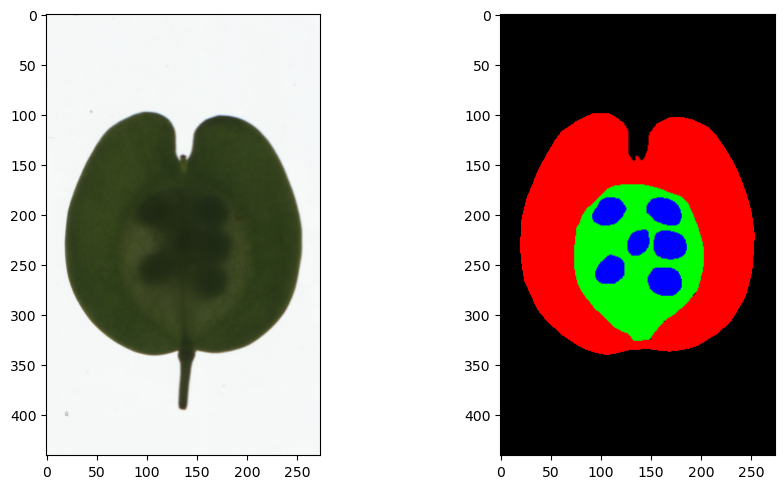

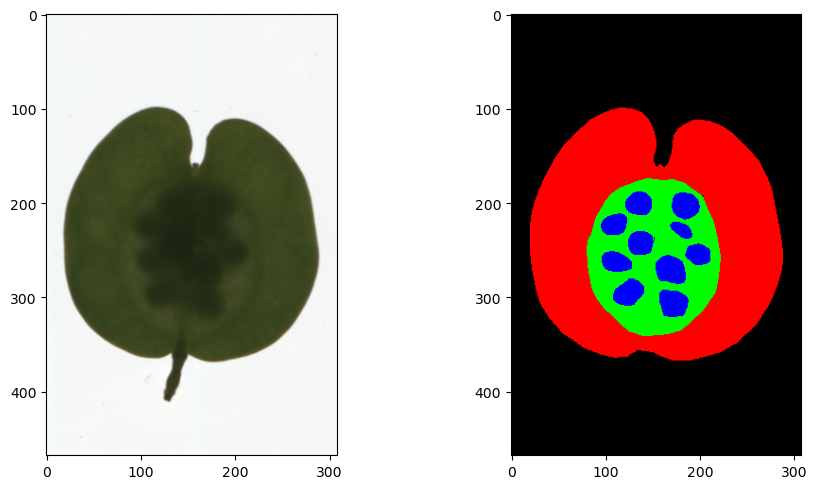

In [ ]:
names = [os.path.basename(f) for f in glob.glob('../data/raw/pod_segmentation/images_by_pod/*.png')]
for n in names:
    img = Image.open('../data/raw/pod_segmentation/images_by_pod/' + n)
    img = np.array(img)[:, :, :3]
    msk = Image.open('../data/raw/pod_segmentation/masks_by_pod/' + n)
    msk = np.array(msk)[:, :, :3]
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(img)
    axs[1].imshow(msk)
    plt.tight_layout()
    plt.show()

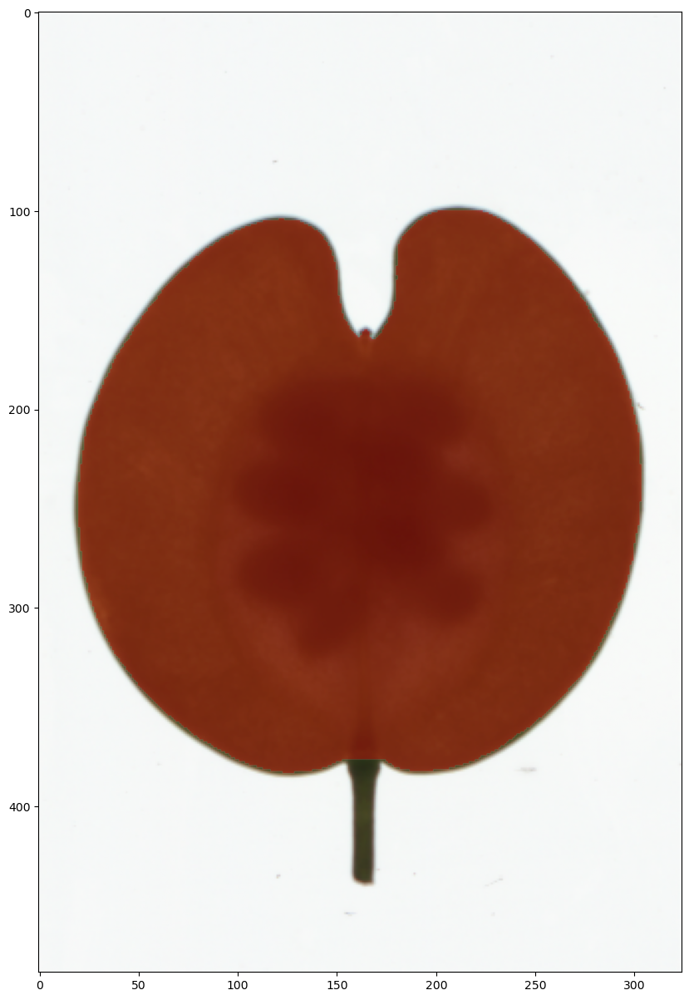

In [ ]:
# function to overlay train/val split on image
def apply_overlay(ax, mask, rgb, alpha=0.35):
    overlay = np.ones((mask.shape[0], mask.shape[1], 4))
    overlay[:, :, 3] = 0
    overlay[mask] = rgb + [alpha]
    ax.set_autoscale_on(False)
    ax.imshow(overlay)

fig = plt.figure(figsize=(15, 15))
plt.imshow(image[bboxes[0]])
apply_overlay(plt.gca(), mask[bboxes[0]].sum(-1) > 0, [1, 0, 0])
plt.show()